In [1]:
import numpy as numpy
import xarray as xr
import pyart
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import rc
import os

import sys
sys.path.append("/home/robbyfrost/Analysis/TurbTor_Lidar")
from functions import *


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [2]:
plt.rcParams['axes.labelweight'] = 'normal'
plt.rcParams['text.latex.preamble'] = r'\usepackage{bm}'

# Other plotting setup
rc('font', family='sans-serif')
rc('font', weight='normal', size=15)
rc('figure', facecolor='white')

In [3]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

clevs = np.linspace(0.,2.0,20)
colors = ['firebrick','red','darkorange','gold','green','lightgreen','lawngreen','aquamarine', 'cyan', 'deepskyblue','dodgerblue','blue', 'magenta']
#colors = ['white','red','darkorange','gold','green','lightgreen','lawngreen','aquamarine', 'cyan', 'deepskyblue','dodgerblue','blue', 'magenta']
cmap_kdp = ListedColormap(colors)

# set up a CC (rhohv) colormap
cdict = {'red':   [[0.0,  0.0, 0.0],
                    [0.5,  0.0, 0.0],
                    [0.85,  1.0, 1.0],
                    [1.0,  1.0, 1.0]],
            'green': [[0.0,  0.0, 0.0],
                    [0.25, 0.0, 0.0],
                    [0.5,  0.0, 0.0],
                    [0.85,  1.0, 1.0],
                    [1.0,  0.0, 0.0]],
            'blue':  [[0.0,  1.0, 1.0],
                    [0.5,  1.0, 1.0],
                    [1.0,  0.1, 0.1]]}

cc_cmap = LinearSegmentedColormap('testCmap', segmentdata=cdict, N=256)
ticks = np.arange(1,14)
labs = ['L/MR','HR','R/Ha','BD','AP','BI','UK','NE','DS','WS','CY','','GR','+']

In [4]:
directory = "/home/robbyfrost/Analysis/TurbTor_Misc_Code/raxpol/"

rall = []
for filename in sorted(os.listdir(directory)):
    if filename.startswith("cfrad"):
        dfile = os.path.join(directory, filename)

        ds = xr.open_dataset(dfile)
        rall.append(ds)

In [6]:
rall[0].elevation[0].values

array(0.81299955, dtype=float32)

In [12]:
str(ds.time[-1].values)[11:19]

'00:11:13'

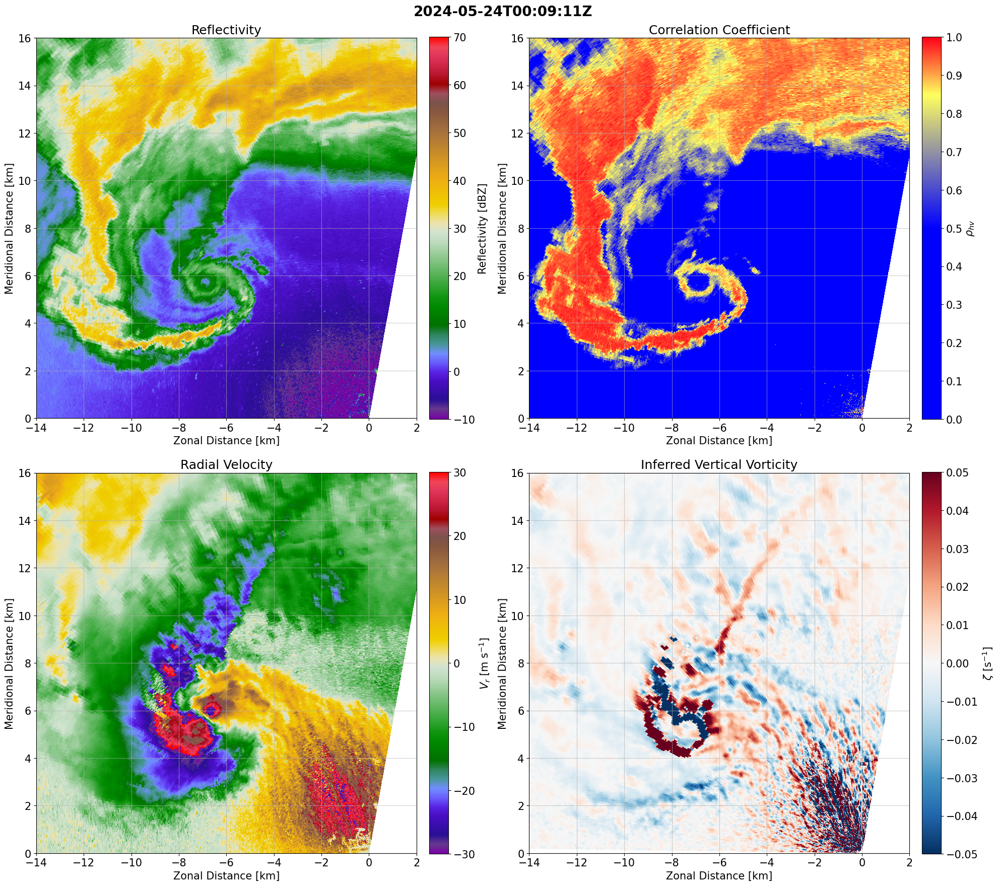

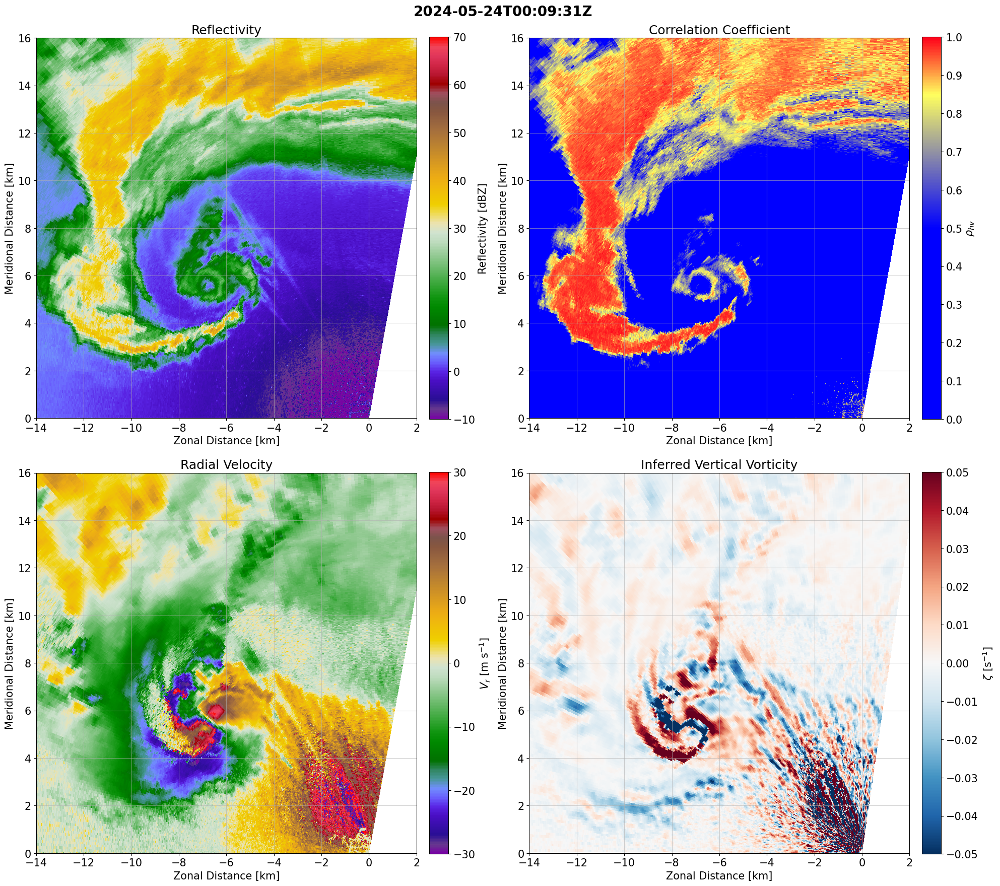

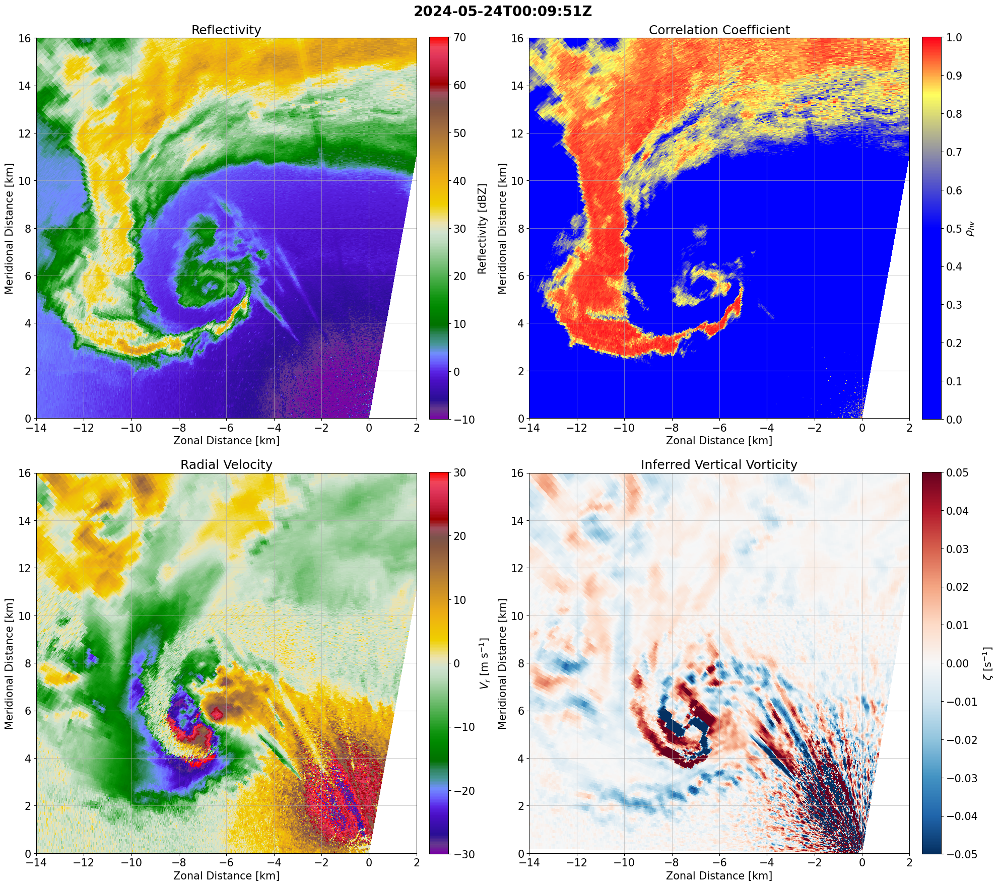

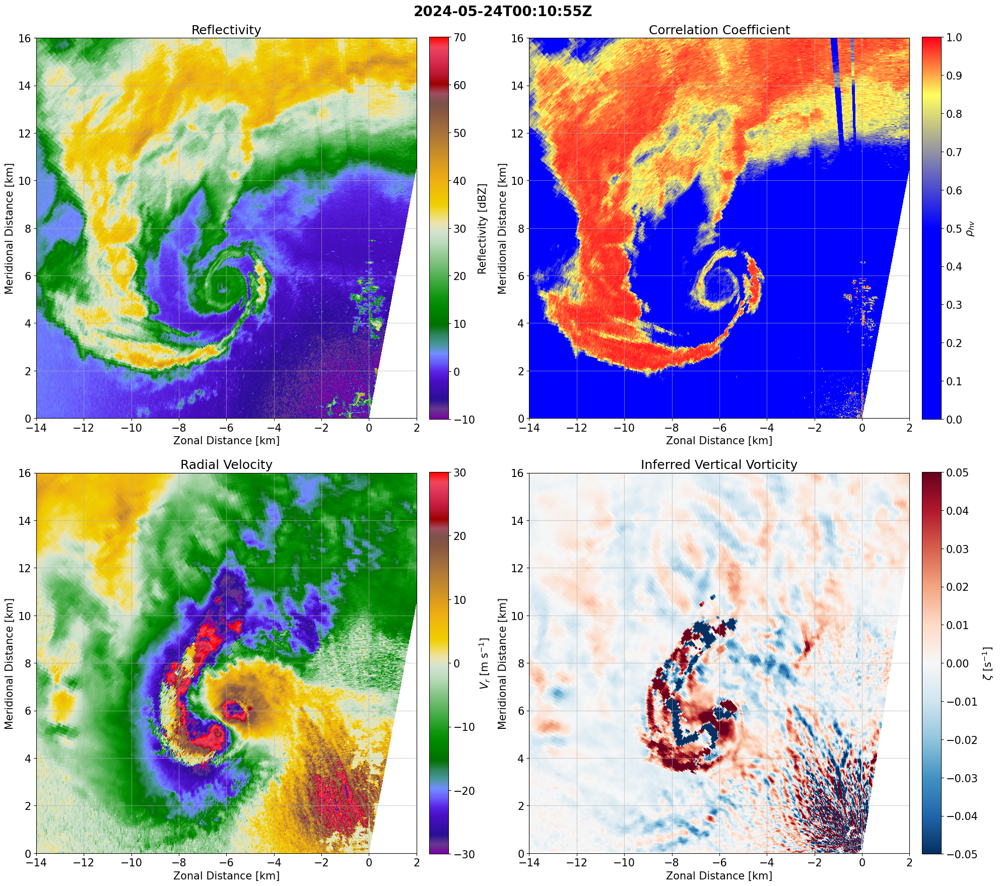

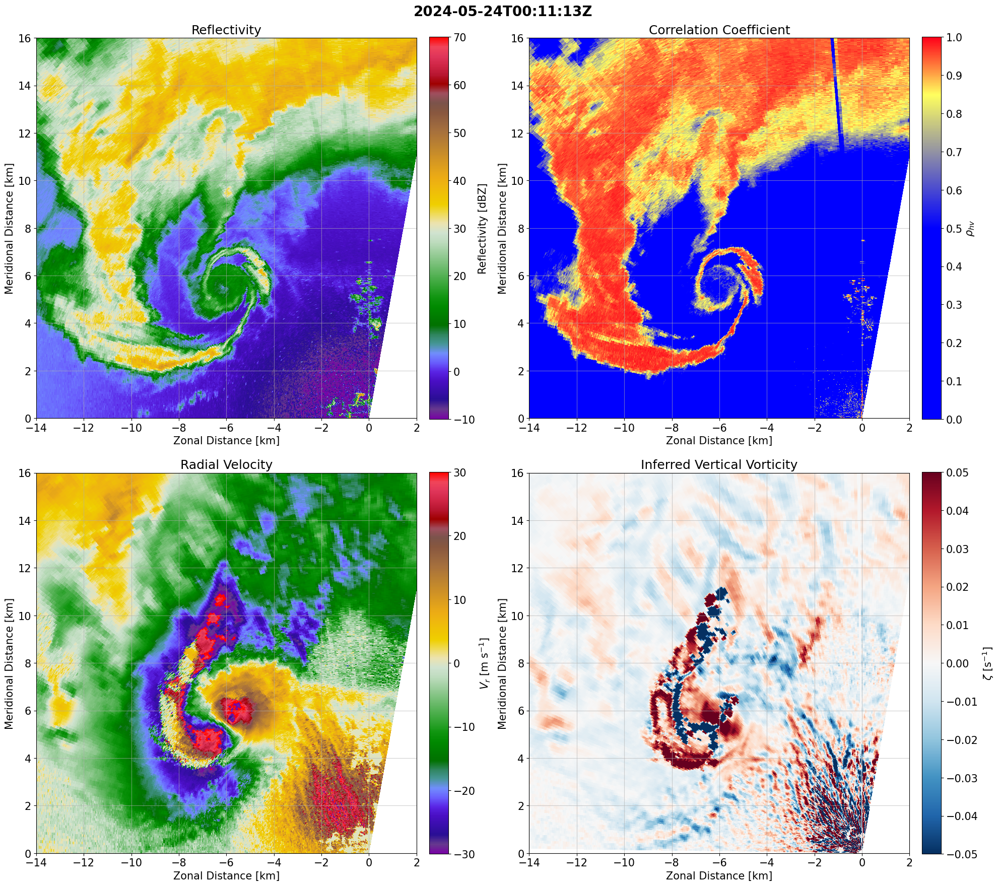

In [19]:
for i, ds in enumerate(rall):
    r = ds.range.values
    az = ds.azimuth.values
    dbz = ds.DBZ.values
    vr = ds.VEL.values
    rhohv = ds.RHOHV.values
    time = str(ds.time[-1].values)[:19]
    vr_smoothed = xr.DataArray(vr, dims=("az","r"), coords={'az': az, 'r': r}).rolling(az=5,r=5).mean().values
    vort_z = ( (vr_smoothed[1:,:] - vr_smoothed[:-1,:]) / (np.deg2rad(az[1:]) - np.deg2rad(az[:-1]))[:,np.newaxis] ) * (1 / r)
    XX, YY = dis_angle_to_2Dxy(r,north0_to_arctheta(az))

    fig, ax = plt.subplots(figsize=(20,18), 
                           nrows=2, ncols=2)
    
    # reflectivity
    vmin, vmax = -10, 70
    pcm1 = ax[0,0].pcolormesh(XX/1e3, YY/1e3, dbz.T,
                    vmin=vmin, vmax=vmax,
                    cmap="pyart_Carbone42")
    ax[0,0].set_title("Reflectivity")
    cbar1 = fig.colorbar(pcm1, ax=ax[0,0], aspect=20, pad=0.03, fraction=0.06, shrink=1)
    cbar1.set_label("Reflectivity [dBZ]")
    cbar1.set_ticks(np.arange(vmin, vmax+0.001, 10))
    # CC
    vmin, vmax = 0, 1
    pcm1 = ax[0,1].pcolormesh(XX/1e3, YY/1e3, rhohv.T,
                    vmin=vmin, vmax=vmax,
                    cmap=cc_cmap)
    ax[0,1].set_title("Correlation Coefficient")
    cbar1 = fig.colorbar(pcm1, ax=ax[0,1], aspect=20, pad=0.03, fraction=0.06, shrink=1)
    cbar1.set_label("$\\rho_{hv}$")
    cbar1.set_ticks(np.arange(vmin, vmax+0.001, 0.1))
    # radial velocity
    vmin, vmax = -30, 30
    pcm2 = ax[1,0].pcolormesh(XX/1e3, YY/1e3, vr.T,
                    vmin=vmin, vmax=vmax,
                    cmap="pyart_Carbone42")
    ax[1,0].set_title("Radial Velocity")
    cbar2 = fig.colorbar(pcm2, ax=ax[1,0], aspect=20, pad=0.03, fraction=0.06, shrink=1)
    cbar2.set_label("$V_r$ [m s$^{-1}$]")
    cbar2.set_ticks(np.arange(vmin, vmax+0.001, 10))
    # vertical vorticity
    vmin, vmax = -0.05, 0.05
    pcm3 = ax[1,1].pcolormesh(XX[:,:-1]/1e3, YY[:,:-1]/1e3, vort_z.T,
                    vmin=vmin, vmax=vmax,
                    cmap="RdBu_r")
    ax[1,1].set_title("Inferred Vertical Vorticity")
    cbar3 = fig.colorbar(pcm3, ax=ax[1,1], aspect=20, pad=0.03, fraction=0.06, shrink=1)
    cbar3.set_label("$\\zeta$ [s$^{-1}$]")
    cbar3.set_ticks(np.arange(vmin, vmax+0.001, 0.01))

    plt.suptitle(f"{time}Z", fontweight="bold", fontsize=20)

    for iax in ax[0,:]:
        iax.set_aspect('equal')
        iax.grid(alpha=0.6)
        iax.set_ylim(0,16)
        iax.set_xlim(-14,2)
        iax.set_ylabel("Meridional Distance [km]")
        iax.set_xlabel("Zonal Distance [km]")
    for iax in ax[1,:]:
        iax.set_aspect('equal')
        iax.grid(alpha=0.6)
        iax.set_ylim(0,16)
        iax.set_xlim(-14,2)
        iax.set_ylabel("Meridional Distance [km]")
        iax.set_xlabel("Zonal Distance [km]")

    fig.tight_layout()

    plt.show()
    plt.close(fig)

In [14]:
str(ds.time[-1].values)

'2024-05-24T00:11:13.299729016'